## Different used imports

In [1]:
import os
from copy import deepcopy

import time
from datetime import datetime

import numpy as np
import scipy, scipy.fftpack

import pandas
import geopandas

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

import shapely.wkt, shapely.geometry

import pwlf

## Prepare data

### 1. Open Agristats as a DataFrame

In [2]:
pandasFilteredAgristats = pandas.read_csv('Agristats/AgristatsSimplified.txt', sep=';')
pandasFilteredAgristats['geometry'] = pandasFilteredAgristats['geometry'].apply(shapely.wkt.loads)
pandasFilteredAgristats = geopandas.GeoDataFrame(pandasFilteredAgristats, crs='epsg:2157', geometry='geometry')

print (pandasFilteredAgristats)

               EDNAME  HNVf_likel  \
0    Balbriggan Rural    3.187518   
1        Kilsallaghan    3.210960   
2                Lusk    3.316044   
3         Ballyboghil    3.229751   
4          Balscadden    3.137701   
..                ...         ...   
218       NotMeasured   -1.000000   
219       NotMeasured   -1.000000   
220       NotMeasured   -1.000000   
221       NotMeasured   -1.000000   
222       NotMeasured   -1.000000   

                                              geometry  
0    POLYGON ((718202.761 766363.462, 718354.244 76...  
1    POLYGON ((713184.247 751738.450, 713374.845 75...  
2    POLYGON ((721318.763 751862.282, 721279.051 75...  
3    POLYGON ((713058.664 756203.332, 713075.696 75...  
4    POLYGON ((716530.434 766315.265, 716496.304 76...  
..                                                 ...  
218  MULTIPOLYGON (((480153.268 601808.231, 480153....  
219  POLYGON ((554136.442 641129.854, 554136.442 64...  
220  MULTIPOLYGON (((541406.612 742006.865

### 2. Open MODIS as a DataFrame

In [3]:
def readModis(path):

    columnsType = {'x_ITM': float, 'y_ITM': float, 'x_MODIS': float, 'y_MODIS': float, 'satellite': str, 'square': int,
                  'year': int, 'doy': int, 'evi': float, 'ndvi': float, 'QC': int, 'date': str}

    fileName = path

    pandasMODIS = pandas.read_csv(fileName, delim_whitespace=True, dtype=columnsType)
    pandasMODIS = pandasMODIS.reset_index(drop=True)
    
    return pandasMODIS

In [4]:
pandasMODIS = readModis('modis_pasture_A2017_square1_d_sq.txt')
print (pandasMODIS)

               x_ITM          y_ITM        x_MODIS       y_MODIS satellite  \
0      714443.370165  761937.917724 -413854.084039  5.959476e+06     Terra   
1      714675.717152  761943.567815 -413622.427680  5.959476e+06     Terra   
2      714908.064012  761949.229370 -413390.771322  5.959476e+06     Terra   
3      715605.103827  761966.282823 -412695.802247  5.959476e+06     Terra   
4      715837.450176  761971.990235 -412464.145889  5.959476e+06     Terra   
...              ...            ...            ...           ...       ...   
17329  713447.778829  752172.784228 -415938.991263  5.949746e+06      Aqua   
17330  713680.125647  752178.367325 -415707.334905  5.949746e+06      Aqua   
17331  713912.472342  752183.961850 -415475.678546  5.949746e+06      Aqua   
17332  717862.346899  752280.817224 -411537.520456  5.949746e+06      Aqua   
17333  718094.691314  752286.617450 -411305.864098  5.949746e+06      Aqua   

       square  year  doy     evi    ndvi  QC        date  
0   

### 3. Remove coordinates with a gap in measurements (> 30 days)

In [5]:
def removeGaps(pandasMODIS, gapSize):
    diffCoords = pandasMODIS.groupby(['x_ITM', 'y_ITM'])

    toDelete = []

    for key, values in (diffCoords):
        dates = (values.date.tolist())

        for i in range (len(dates)):
            dates[i] = datetime.strptime(dates[i], '%Y-%m-%d')

        year = dates[0].year

        dates = sorted(dates)
        dates.insert(0, datetime.strptime('{}-01-01'.format(year), '%Y-%m-%d'))
        dates.append(datetime.strptime('{}-12-31'.format(year), '%Y-%m-%d'))

        for i in range (len(dates)-1):
            delta = dates[i+1] - dates[i]
            if delta.days > gapSize:
                toDelete.append(key)
                break

    print ("There is {} time series on different pixels".format(len(diffCoords)))
    print ("There is {} time series with a gap superior than {} days".format(len(toDelete), gapSize))
    print ("It remains {} time series to treat".format(len(diffCoords) - len(toDelete)))

    if len(toDelete) > 0:
        for coords in toDelete:
            pandasMODIS = pandasMODIS.drop(pandasMODIS.loc[(pandasMODIS['x_ITM'] == coords[0]) & (pandasMODIS['y_ITM'] == coords[1])].index)
    
    return pandasMODIS

In [6]:
woGapsMODIS = removeGaps(pandasMODIS, 35)

There is 462 time series on different pixels
There is 84 time series with a gap superior than 35 days
It remains 378 time series to treat


### 4. Recuperate geometry and Agristats cluster

In [7]:
def pandasToGeo(pandasData):
    geometry = [shapely.geometry.Point(xy) for xy in zip(pandasMODIS.x_ITM, pandasMODIS.y_ITM)]
    geoMODIS = geopandas.GeoDataFrame(pandasMODIS, crs='epsg:2157', geometry=geometry)
    
    return geoMODIS

geoMODIS = pandasToGeo(woGapsMODIS)

geoMODIS = geopandas.sjoin(geoMODIS, pandasFilteredAgristats, op='within')
geoMODIS = geoMODIS.groupby(['index_right', 'EDNAME', 'HNVf_likel', 'x_ITM', 'y_ITM'], sort=False)

## Adapted functions from smoothing tests

In [8]:
def sameDays(doys, quality, dates, evi):
    if len(set(doys)) != len(doys):
        # Keep best quality values
        removeIndexes = []
        for i in range (len(doys)):
            for j in range (i+1, len(doys)):
                if doys[i] == doys[j]:
                    if quality[i] < quality[j]:
                        removeIndexes.append(j)
                    elif quality[j] < quality[i]:
                        removeIndexes.append(i)
        
        removeIndexes = sorted(set(removeIndexes), reverse=True)
        
        for index in removeIndexes:
            del doys[index]
            del dates[index]
            del evi[index]
            del quality[index]
            
        if len(set(doys)) != len(doys):
            # Take the average
            finished = False
            treatedDays = []
            while finished == False:
                finished = True
                for i in range (len(doys)):
                    if doys[i] in treatedDays:
                        continue
                    else:
                        treatedDays.append(doys[i])
                        indSame = []
                        for j in range (i+1, len(doys)):
                            if doys[i] == doys[j]:
                                indSame.append(j)
                        
                        if len(indSame) > 0:
                            
                            finished = False
                            
                            eviAverage = evi[i]
                            
                            for k in indSame:
                                eviAverage += evi[k]
                            eviAverage /= (len(indSame) + 1)
                            
                            for k in reversed(indSame):
                                del doys[k]
                                del dates[k]
                                del evi[k]
                                del quality[k]
                                
                            evi[i] = eviAverage
                            
                            break
    
    return doys, dates, evi

In [9]:
def linearInterpolation(doys, dates, evi):
    # Series values
    eviSeries = pandas.Series(evi, pandas.to_datetime(dates))
    eviUpSeries = eviSeries.resample('1D', axis=0, kind='DateTimeIndex').interpolate(method='linear')
    
    # List values
    doyUp = np.arange(min(doys), max(doys)+1, 1)
    eviUpArray = eviUpSeries.values
    
    return doyUp, eviUpArray

In [10]:
def fourierSmoothing(doyUp, eviUpArray): 
    eviRft = scipy.fftpack.rfft(eviUpArray)
    
    eviRft[2::] = 0
    
    eviFourier = scipy.fftpack.irfft(eviRft, n=len(doyUp))
    
    return eviFourier

## Functions for breakdates identification

### 1. Segmentation

In [11]:
def linearPiecewise(nbYear, listDoy, listEvi, approx=False):
    nbSegments = (nbYear * 4) + 1
    
    eviPwlf = pwlf.PiecewiseLinFit(listDoy, listEvi, degree=1)
    
    if approx == False:
        pieceBreaks = eviPwlf.fit(nbSegments)
    else:
        pieceBreaks = eviPwlf.fit_guess(approx)
    
    eviPwlf = eviPwlf.predict(listDoy)

    breaksDoy = [int(round(num)) for num in pieceBreaks]
    breaksDates = []
    
    for day in breaksDoy:
        breaksDates.append(datetime.strftime(datetime.strptime(str(day), '%j'), '%m/%d'))
    
    return (eviPwlf, breaksDoy, breaksDates)

### 2. Amplitude

In [12]:
def amplitudeThresh(listDoy, listEvi):
    amplitude = max(listEvi)-min(listEvi)
    
    percentageLine = ([0.10 * amplitude + min(listEvi)] * len(listDoy),
                      [0.94 * amplitude + min(listEvi)] * len(listDoy))
    
    breaks =  list((np.argwhere(np.diff(np.sign(np.array(listEvi) - np.array(percentageLine[0]))) != 0))[:,0])
    breaks += list((np.argwhere(np.diff(np.sign(np.array(listEvi) - np.array(percentageLine[1]))) != 0))[:,0])
    breaks = [i+1 for i in breaks] # à voir
    breaks.sort()
    
    breaksDoy = [listDoy[i] for i in breaks]
    breaksDates = []
        
    for day in breaksDoy:
        breaksDates.append(datetime.strftime(datetime.strptime(str(day)+'-2017', '%j-%Y'), '%m/%d'))
    
    return (percentageLine, breaksDoy, breaksDates)

### 3. Slopes

In [13]:
def slopeThresh(listDoy, listEvi):
    coefficients, c = [], []
    importantDays = []
    importantIndex = []
    thresh = []
    breaks = []
        
    for count in range (len(listDoy)-1):
        c.append(((listEvi[count+1]-listEvi[count]) / (listDoy[count+1]-listDoy[count])))
        
    for i in range (1, len(listDoy)-1):
        coefficients.append((c[i] + c[i-1]) / 2)
        
    coefficients.insert(0, 0)
    coefficients.append(0)
    
    importantIndex.append(coefficients.index(max(coefficients)))
    importantIndex.append(coefficients.index(min(coefficients)))

    importantDays.append(listDoy[importantIndex[0]])
    importantDays.append(listDoy[importantIndex[1]])

    importantIndex.insert(1, importantIndex[0] + np.array(np.abs(coefficients[importantIndex[0]:importantIndex[1]+1:])).argmin())
    importantDays.insert(1, listDoy[importantIndex[1]])

    thresh.append(0.63 * coefficients[importantIndex[0]])
    thresh.append(0.49 * coefficients[importantIndex[0]])
    thresh.append(0.49 * coefficients[importantIndex[2]])
    thresh.append(0.63 * coefficients[importantIndex[2]])
    
    try:
        breaks.append((list((np.argwhere(np.diff(np.sign(np.array(coefficients[:importantIndex[0]+1:]) - thresh[0])) != 0))[:,0]))[0])
        breaks.append(importantIndex[0] + (list((np.argwhere(np.diff(np.sign(np.array(coefficients[importantIndex[0]:importantIndex[1]+1:]) - thresh[1])) != 0))[:,0]))[0])
        breaks.append(importantIndex[1] + (list((np.argwhere(np.diff(np.sign(np.array(coefficients[importantIndex[1]:importantIndex[2]+1:]) - thresh[2])) != 0))[:,0]))[0])
        breaks.append(importantIndex[2] + (list((np.argwhere(np.diff(np.sign(np.array(coefficients[importantIndex[2]::]) - thresh[3])) != 0))[:,0]))[0])
    except IndexError:
        pass
    
    breaksDoy = [listDoy[val] for val in breaks]
    
    breaksDates = []
    for day in breaksDoy:
        breaksDates.append(datetime.strftime(datetime.strptime(str(day), '%j'), '%m/%d'))
    
    return (breaksDoy, breaksDates, coefficients)

## Take months information in order to have readable graphics

In [14]:
def monthsInfo(year):
    monthsBound, midMonths, monthsAbb = [], [], []
    
    for month in np.arange(1,13,1):
        monthsBound.append(int(datetime.strftime
                (datetime.strptime('{}-1-{}'.format(month,year), '%m-%d-%Y'), '%j')))
        midMonths.append(int(datetime.strftime
                (datetime.strptime('{}-15-{}'.format(month,year), '%m-%d-%Y'), '%j')))
        monthsAbb.append(datetime.strftime(datetime.strptime(str(month), '%m'), '%b'))
    monthsBound.append(int(datetime.strftime
                (datetime.strptime('12-31-{}'.format(year), '%m-%d-%Y'), '%j')))
    
    return monthsBound, midMonths, monthsAbb

In [15]:
monthsBound, midMonths, monthsAbb = monthsInfo(2017)
print ("Delimitations of months in doy: {}\nMid months in doy: {}\nMonths' abbreviations: {}".format(monthsBound, midMonths, monthsAbb))

Delimitations of months in doy: [1, 32, 60, 91, 121, 152, 182, 213, 244, 274, 305, 335, 365]
Mid months in doy: [15, 46, 74, 105, 135, 166, 196, 227, 258, 288, 319, 349]
Months' abbreviations: ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']


## Function to plot some graphics

In [16]:
def graphFails(doys, evi, doyUp, eviSmooth, monthsBound, midMonths, monthsAbb):
    fig = plt.figure(figsize=(12,4), dpi=200)
    plt.suptitle('Failure on breakdates identification', size='xx-large', weight='bold', y=1)

    plt.title('EVI', size='x-large', weight='bold')
    plt.plot(doys, evi, 'b:o', markersize=3, label='Raw data', alpha=0.7)
    plt.plot(doyUp, eviSmooth, 'r', markersize=3, label='Fourier smoothing', alpha=0.7)
    plt.ylim(0,1)
    plt.ylabel('EVI', size='large', style='italic')
    plt.xlim(1,365)
    plt.xlabel("Year's day", size='large', style='italic')
    plt.legend(loc='center left', bbox_to_anchor=(1.01,0.5))
    plt.grid()

    fig.subplots_adjust(top=0.8, right=0.77)

    axes = plt.gca()

    axes.xaxis.set_ticks(monthsBound)
    axes.xaxis.set_tick_params(length=15)
    axes.xaxis.set_ticklabels([''])

    axes.xaxis.set_ticks(midMonths, minor=True)
    axes.xaxis.set_tick_params(length=0, which='minor')
    axes.xaxis.set_ticklabels(monthsAbb, minor=True)

    plt.xlabel("Months", size='large', style='italic')

    plt.show()

## Recuperate breakdates

In [17]:
def breakdates(geoMODIS, fails = False):

    tic = time.time()
    
    for key, values in geoMODIS:
        year = values.date.values[0][:4:]
        break
    
    monthsBound, midMonths, monthsAbb = monthsInfo(year)
    
    breaksPiece, breaksAmpli, breaksSlope = [], [], []

    pandasBreaks = pandas.DataFrame(columns=['index_agristats', 'x_MODIS', 'y_MODIS', 'breaksPiecewise', 'breaksAmplitude', 'breaksSlope'])

    allEvi, allDoy = [], []
    allSmoothEvi, allSmoothDoy = [], []
    addInfo = {}

    for key, values in geoMODIS:

        values = values.sort_values('doy')

        doys = values['doy'].tolist()
        dates = values['date'].tolist()
        evi = values['evi'].tolist()
        quality = values['QC'].tolist()

        nbMeasurements = len(doys)

        for i in range (len(dates)):
            dates[i] = datetime.strptime(dates[i], '%Y-%m-%d')


        # Treat same days
        doys, dates, evi = sameDays(doys, quality, dates, evi)


        # Interpolation
        doyUp, eviUpArray = linearInterpolation(doys, dates, evi)


        # Fourier smoothing
        eviSmooth = fourierSmoothing(doyUp, eviUpArray)


        ampli = amplitudeThresh(doyUp, eviSmooth)[1]
        if len(ampli) != 4:
            ampli = []


        try:
            slope = slopeThresh(doyUp, eviSmooth)[0]
            if len(slope) != 4:
                slope = []
        except ValueError:
            slope = []

        
        # If there's a problem on others methods, piecewise isn't calculated
        if (ampli != []) and (slope != []) and ((max(eviSmooth) - min(eviSmooth)) > 0.1):
            addInfo[(key[3], key[4])] = [nbMeasurements, len(doys)]

            #piece = linearPiecewise(1, doyUp, eviSmooth, ampli)[1][1:-1:]
            piece = linearPiecewise(1, doyUp, eviSmooth)[1][1:-1:]
        
        else:
            piece = []
            ampli = []
            slope = []
            
            if fails == True:
                graphFails(doys, evi, doyUp, eviSmooth, monthsBound, midMonths, monthsAbb)
                print ('\n\n')


        breaksPiece.append(piece)
        breaksAmpli.append(ampli)
        breaksSlope.append(slope)
        
        # "all" lists are interesting for further plots
        allEvi.append(evi)
        allDoy.append(doys)

        allSmoothEvi.append(eviSmooth)
        allSmoothDoy.append(doyUp)


        temp = pandas.DataFrame([[key[0], values.x_MODIS.tolist()[0], values.y_MODIS.tolist()[0], piece, ampli, slope]],
                                columns=['index_agristats', 'x_MODIS', 'y_MODIS', 'breaksPiecewise', 'breaksAmplitude', 'breaksSlope'])

        pandasBreaks = pandas.concat([pandasBreaks, temp])


    tac = time.time()
    print ("Processing time to identify breakdates: {} seconds".format(round(tac-tic, 2)))
    
    return pandasBreaks, year, monthsBound, midMonths, monthsAbb, allEvi, allDoy, allSmoothEvi, allSmoothDoy, addInfo

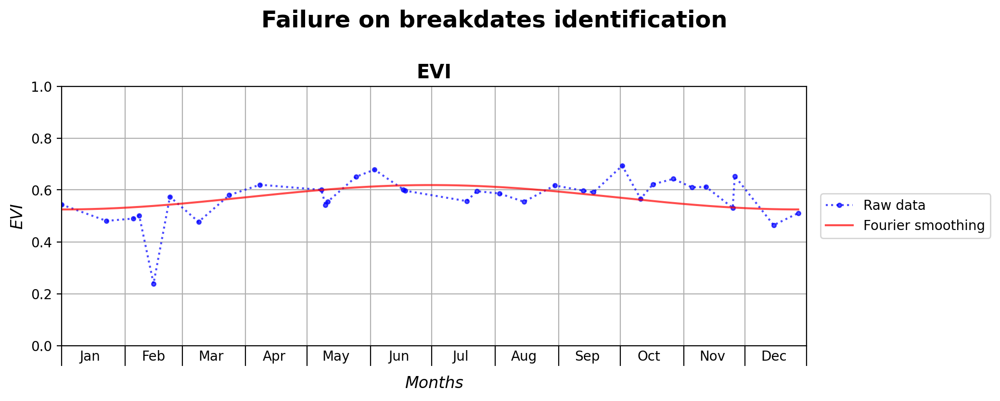

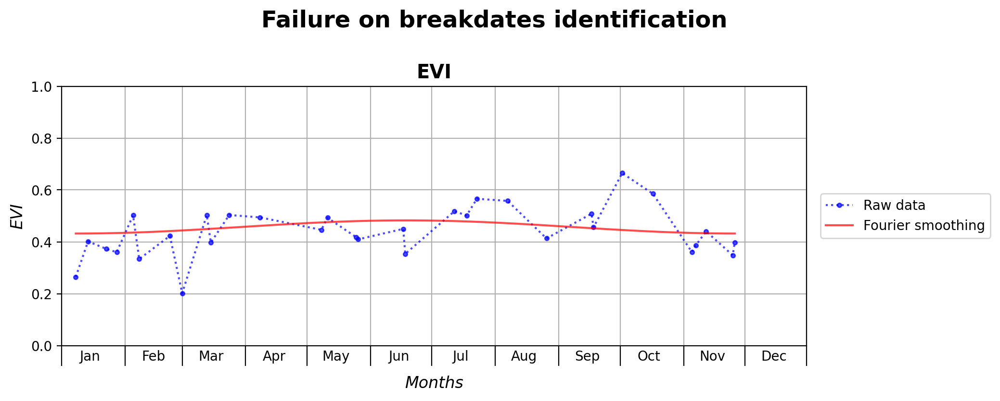

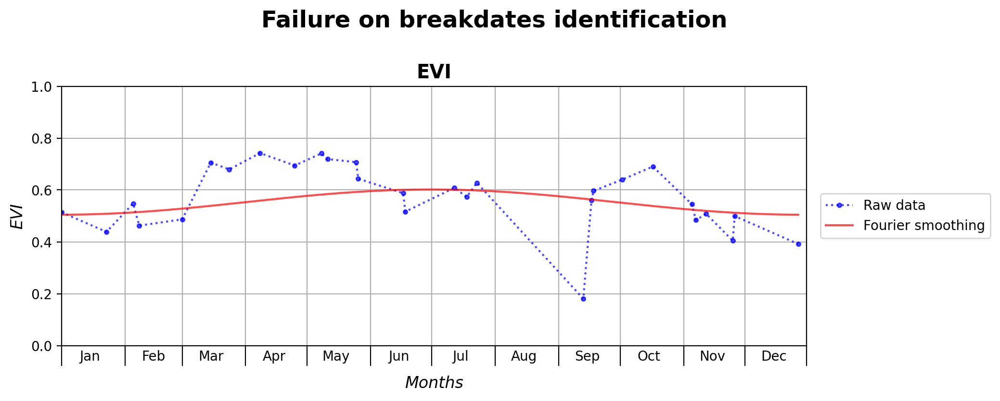

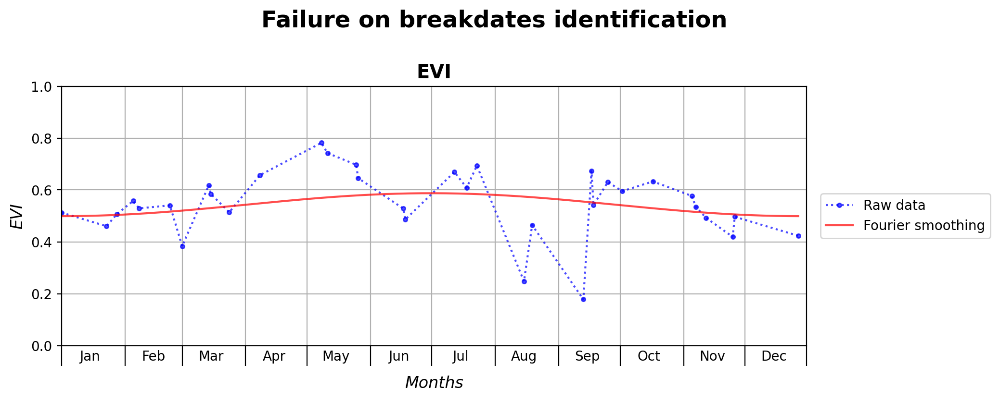

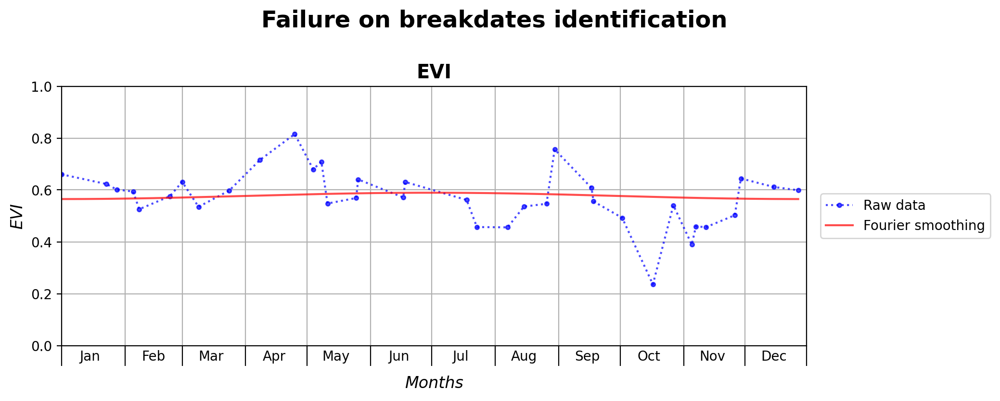

...

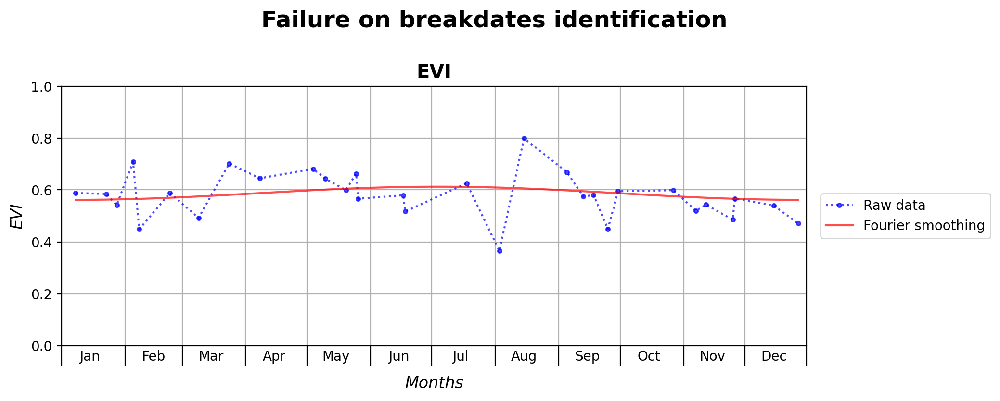

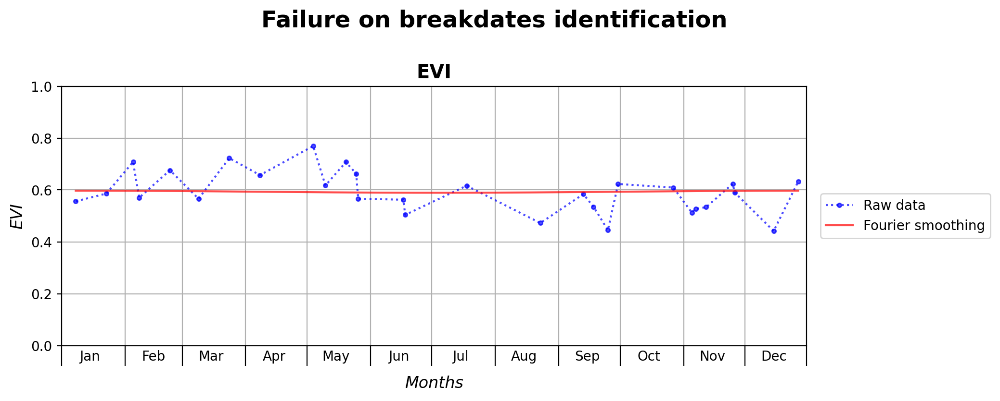

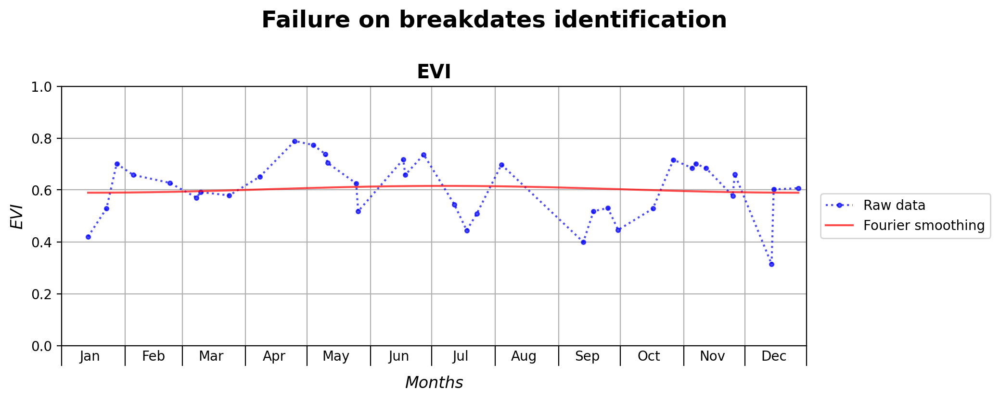

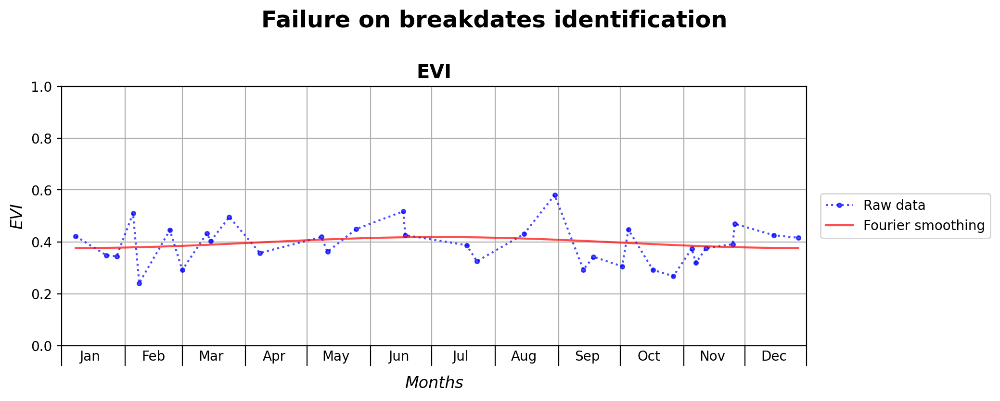

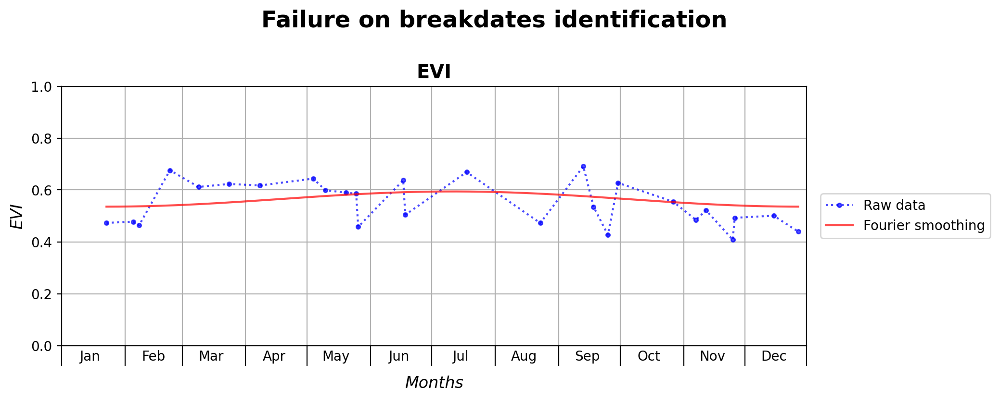




Processing time to identify breakdates: 1060.85 seconds


In [18]:
pandasBreaks, year, monthsBound, midMonths, monthsAbb, allEvi, allDoy, allSmoothEvi, allSmoothDoy, addInfo = breakdates(geoMODIS, fails = True)

## Work on results

### 1. Repartition 

In [19]:
def repartitionPlot(pandasBreaks, year, monthsBound, midMonths, monthsAbb):
    
    colors = ['blue', 'orange', 'green', 'red']

    d = np.arange(0, 366, 1)

    noms = ['Piecewise', 'Amplitude', 'Slope']
    i = 0

    for breaks in (np.array([np.array(li) for li in pandasBreaks.breaksPiecewise.values if (len(li) == 4)]),
                   np.array([np.array(li) for li in pandasBreaks.breaksAmplitude.values if (len(li) == 4)]),
                   np.array([np.array(li) for li in pandasBreaks.breaksSlope.values if (len(li) == 4)])):

        plt.figure(figsize=(12,4), dpi=200)
        handles = []
        maxi = 0

        for j in range (4):
            days = list(np.arange(np.min(breaks[:,j]), np.max(breaks[:,j])+1, 1))
            size = np.zeros(len(days))

            for day in breaks[:,j]:
                size[days.index(day)] += 1

            if maxi < np.max(size):
                maxi = np.max(size)

            plotLegend = plt.bar(days, np.array(size), color=colors[j], label='Breakpoint {}'.format(j+1))
            handles.append(plotLegend)

            plt.vlines([np.mean(breaks[:,0]), np.mean(breaks[:,1]), np.mean(breaks[:,2]), np.mean(breaks[:,3])], 0, 1, colors='black', linestyle='--', linewidth=1)


        plt.title(noms[i], size='xx-large', weight='bold')
        i += 1

        handles.insert(0, mlines.Line2D([], [], color='black', linestyle='--', label='Means'))
        plt.legend(handles=handles, loc='center left', bbox_to_anchor=(1.01,0.5))
        plt.ylabel('Occurrences', size='large', style='italic')
        plt.ylim(0, np.ceil(maxi/10)*10)
        plt.xlabel("Year's day", size='large', style='italic')
        plt.xlim(0,365)
        plt.grid()

        axes = plt.gca()

        axes.xaxis.set_ticks(monthsBound)
        axes.xaxis.set_tick_params(length=15)
        axes.xaxis.set_ticklabels([''])

        axes.xaxis.set_ticks(midMonths, minor=True)
        axes.xaxis.set_tick_params(length=0, which='minor')
        axes.xaxis.set_ticklabels(monthsAbb, minor=True)

        plt.xlabel("Months", size='large', style='italic')

        plt.vlines(np.mean(breaks, axis=0), 0, np.ceil(maxi/10)*10, color='black', linestyle='--', linewidth=1)

        axesNew = axes.twiny()
        axesNew.set_xlim(1,365)
        axesNew.xaxis.set_ticks(np.mean(breaks, axis=0))
        axesNew.xaxis.set_tick_params(length=0, labelcolor='black', top=True)
        axesNew.xaxis.set_ticklabels([datetime.strftime(datetime.strptime('{}-{}'.format(int(round(day)), year), '%j-%Y'), '%m/%d') for day in np.mean(breaks, axis=0)])

        plt.show()

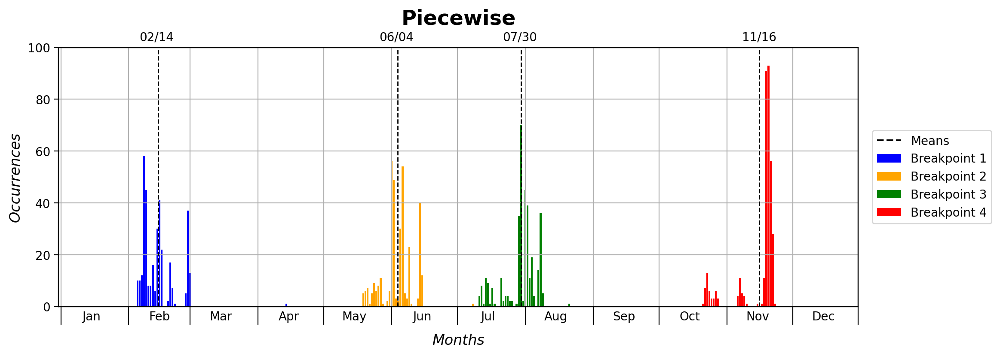

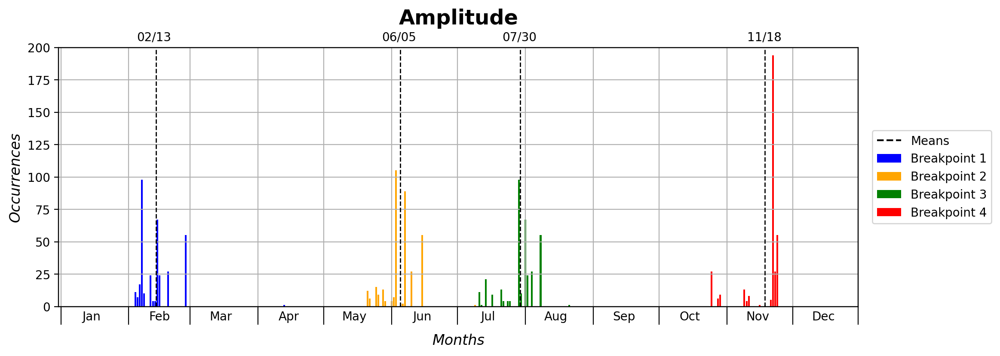

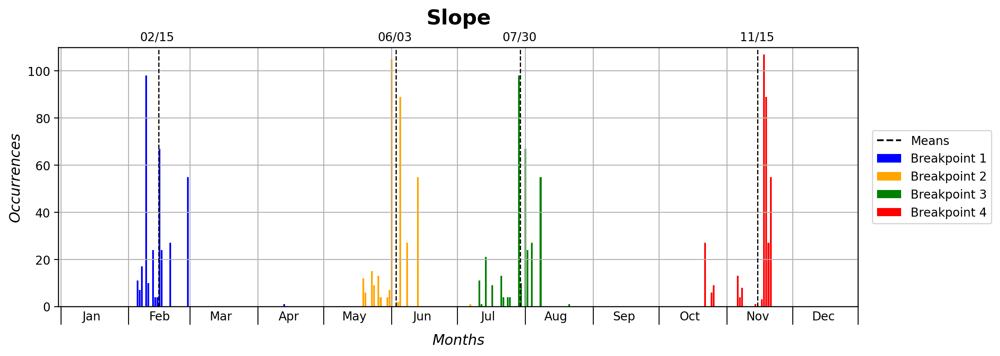

In [20]:
repartitionPlot(pandasBreaks, year, monthsBound, midMonths, monthsAbb)

### 2. Visually look at the differences in breakdates linked to coordinates

In [21]:
def resCoords(pandasBreaks, method):
    """
        :param method: Piecewise, Amplitude or Slope
        :type method: str
    """
    
    meanPiece = (np.mean(np.array([np.array(l) for l in pandasBreaks['breaks{}'.format(method)].tolist() if len(l) == 4]), axis=0))

    pandasBreaks['deviations{}'.format(method)] = pandasBreaks.apply(lambda row: np.array(row['breaks{}'.format(method)]) - meanPiece if len(row['breaks{}'.format(method)]) == 4 else [1000, 1000, 1000, 1000], axis=1)

    x = pandasBreaks.x_MODIS.tolist()
    y = pandasBreaks.y_MODIS.tolist()

    minX, maxX = min(x), max(x)
    minY, maxY = min(y), max(y)

    xFail, yFail = [], []
    toSupp = []

    cm = plt.cm.get_cmap('coolwarm')
    normalize = matplotlib.colors.Normalize(vmin=-10, vmax=10)

    fig, axes = plt.subplots(2, 2, figsize=(13, 13))

    plt.suptitle("Deviations to the mean in days ({})".format(method), size='xx-large', weight='bold', y=0.9)

    for j in range (4):

        values = [l[j] for l in pandasBreaks['deviations{}'.format(method)].tolist() if len(l) == 4]

        if j == 0:
            for i in range (len(values)):
                if values[i] == 1000:
                    xFail.append(x[i])
                    yFail.append(y[i])
                    toSupp.append(i)

            toSupp = sorted(toSupp, reverse=True)
            for i in toSupp:
                del x[i]
                del y[i]

        for i in toSupp:
            del values[i]

        plt.subplot(2, 2, j+1)

        im = plt.scatter(x, y, c=values, marker='.', s=150, edgecolor='none', cmap=cm, norm=normalize)
        plt.scatter(xFail, yFail, c='k', marker='.', s=150, edgecolor='none', label='Not measured')
        plt.title('Breakdate n°{}'.format(j+1), size='x-large', weight='bold')
        plt.xlabel('xMODIS', size='large', style='italic')
        plt.ylabel('yMODIS', size='large', style='italic')
        plt.xlim(minX - 200, maxX + 200)
        plt.ylim(minY - 200, maxY + 200)
        plt.grid()

        plt.gca().set_aspect(aspect='equal')
        plt.gca().yaxis.set_tick_params(length=0)
        plt.gca().xaxis.set_tick_params(length=0)
        plt.gca().yaxis.set_ticklabels([])
        plt.gca().xaxis.set_ticklabels([])

    fig.subplots_adjust(hspace=-0.05, wspace=0.1, right=0.8)

    sm = plt.cm.ScalarMappable(cmap=cm, norm=normalize)
    fig.colorbar(sm, ax=axes.ravel().tolist(), orientation='vertical', fraction=0.1, shrink=0.5)

    plt.show()

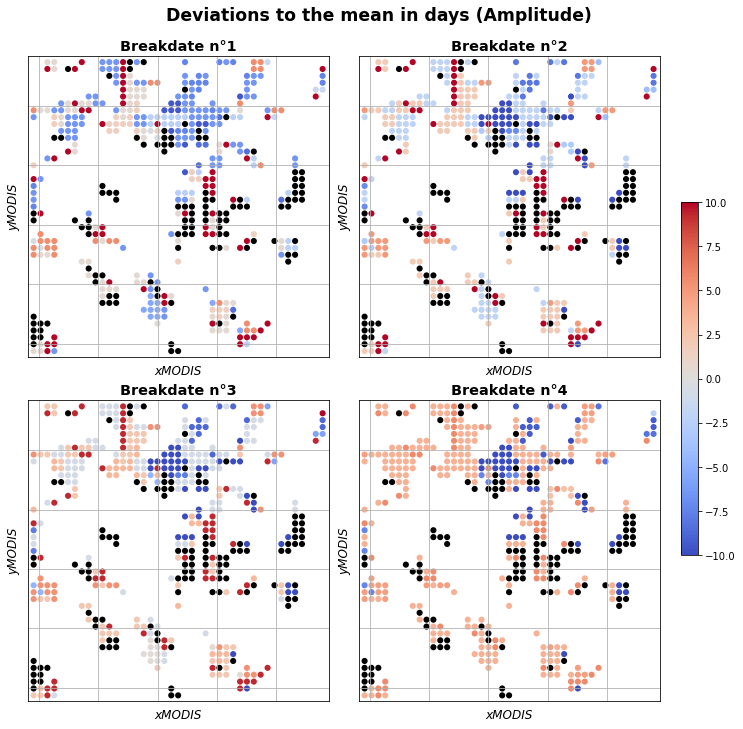

In [22]:
resCoords(pandasBreaks, 'Amplitude')

### 3. Look at the repartition of breakdates with the different methods on a time series

In [23]:
def pixRepartition(pandasBreaks, monthsBound, midMonths, monthsAbb, allEvi, allDoy, allSmoothEvi, allSmoothDoy, index):

    fig = plt.figure(figsize=(12,4), dpi=200)
    plt.suptitle('Where ?', size='xx-large', weight='bold', y=1)

    plt.title('EVI', size='x-large', weight='bold')
    plt.plot(allDoy[index], allEvi[index], 'b:o', markersize=3, label='Raw data', alpha=0.7)
    plt.plot(allSmoothDoy[index], allSmoothEvi[index], 'r', markersize=3, label='Fourier smoothing', alpha=0.7)
    plt.vlines(np.array([np.array(li) for li in pandasBreaks.breaksPiecewise.values if (len(li) == 4)])[index], 0, 1, linewidth=1, label='Piecewise', color='m')
    plt.vlines(np.array([np.array(li) for li in pandasBreaks.breaksAmplitude.values if (len(li) == 4)])[index], 0, 1, linewidth=1, label='Amplitude', color='y')
    plt.vlines(np.array([np.array(li) for li in pandasBreaks.breaksSlope.values if (len(li) == 4)])[index], 0, 1, linewidth=1, label='Slope', color='c')
    plt.ylim(0,1)
    plt.ylabel('EVI', size='large', style='italic')
    plt.xlim(1,365)
    plt.xlabel("Year's day", size='large', style='italic')
    plt.legend(loc='center left', bbox_to_anchor=(1.01,0.5))
    plt.grid()

    fig.subplots_adjust(top=0.8, right=0.77)

    axes = plt.gca()

    axes.xaxis.set_ticks(monthsBound)
    axes.xaxis.set_tick_params(length=15)
    axes.xaxis.set_ticklabels([''])

    axes.xaxis.set_ticks(midMonths, minor=True)
    axes.xaxis.set_tick_params(length=0, which='minor')
    axes.xaxis.set_ticklabels(monthsAbb, minor=True)

    plt.xlabel("Months", size='large', style='italic')

    plt.show()

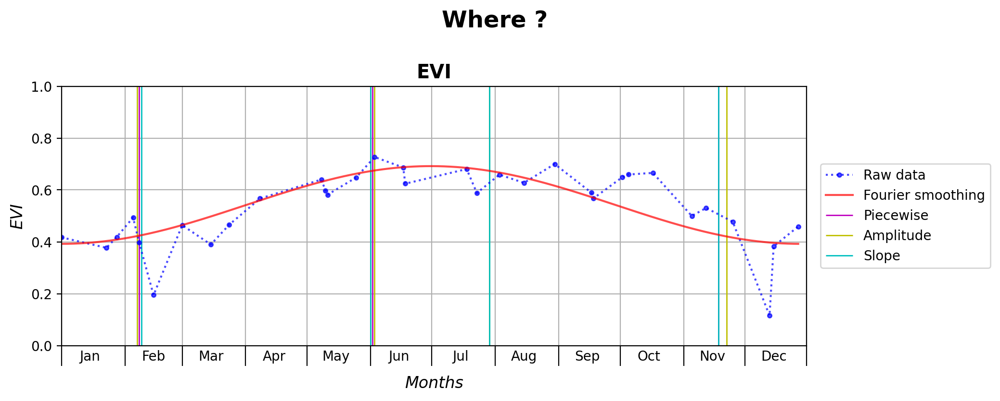

In [24]:
pixRepartition(pandasBreaks, monthsBound, midMonths, monthsAbb, allEvi, allDoy, allSmoothEvi, allSmoothDoy, 2)

### 4. Look at linear piecewise on a time serie

In [25]:
def lookPiece(allDoy, allEvi, allSmoothDoy, allSmoothEvi, index):
    eviPwlf, pieceBreaksDoy, pieceBreaksDates = linearPiecewise(1, allSmoothDoy[index], allSmoothEvi[index])

    # Graphics
    fig = plt.figure(figsize=(12,4), dpi=200)
    plt.suptitle('Piecewise', size='xx-large', weight='bold', y=0.95)

    plt.plot(allDoy[index], allEvi[index], 'b:o', markersize=3, label='Raw data', alpha=0.7)
    plt.plot(allSmoothDoy[index], allSmoothEvi[index], 'r', markersize=3, label='Fourier smoothing', alpha=0.7)
    plt.plot(allSmoothDoy[index], eviPwlf, color='g', label='Segmented data')
    plt.vlines(pieceBreaksDoy[1:-1:], 0, 1, 'g', linestyle='--')
    plt.ylim(0,1)
    plt.ylabel('EVI', size='large', style='italic')
    plt.xlim(1,365)
    plt.xlabel("Year's day", size='large', style='italic')
    plt.legend(loc='center left', bbox_to_anchor=(1.01,0.5))
    plt.grid()

    fig.subplots_adjust(top=0.8, right=0.77)

    axes = plt.gca()

    axes.xaxis.set_ticks(monthsBound)
    axes.xaxis.set_tick_params(length=15)
    axes.xaxis.set_ticklabels([''])

    axes.xaxis.set_ticks(midMonths, minor=True)
    axes.xaxis.set_tick_params(length=0, which='minor')
    axes.xaxis.set_ticklabels(monthsAbb, minor=True)

    plt.xlabel("Months", size='large', style='italic')

    axesNew = axes.twiny()
    axesNew.set_xlim(1,365)
    axesNew.xaxis.set_ticks(pieceBreaksDoy[1:-1:])
    axesNew.xaxis.set_tick_params(length=0, labelcolor='g', top=True)
    axesNew.xaxis.set_ticklabels(pieceBreaksDates[1:-1:])

    plt.show()

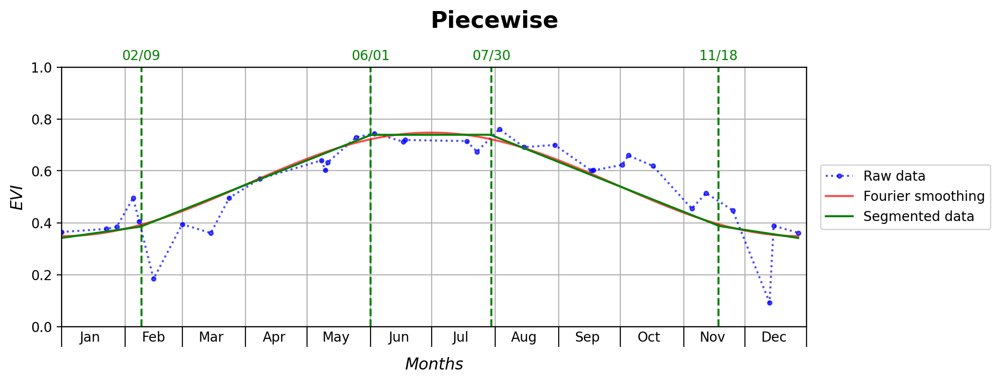

In [26]:
lookPiece(allDoy, allEvi, allSmoothDoy, allSmoothEvi, 1)

### 5. Look at amplitude on a time serie

In [27]:
def lookAmpli(allDoy, allEvi, allSmoothDoy, allSmoothEvi, index):
    percentageLine, ampliBreaksDoy, ampliBreaksDates = amplitudeThresh(allSmoothDoy[index], allSmoothEvi[index])

    # Graphics
    fig = plt.figure(figsize=(12,4), dpi=200)
    plt.suptitle('Thresholds on amplitude', size='xx-large', weight='bold', y=0.95)

    plt.plot(allDoy[index], allEvi[index], 'b:o', markersize=3, label='Raw data', alpha=0.7)
    plt.plot(allSmoothDoy[index], allSmoothEvi[index], 'r', markersize=3, label='Fourier smoothing', alpha=0.7)
    plt.hlines(percentageLine[0][0], 1, 365, 'g', linestyle='--')
    plt.hlines(percentageLine[1][0], 1, 365, 'g', linestyle='--')
    plt.vlines(ampliBreaksDoy, 0, 1, 'g', linestyle='--', label='Thresholds results')
    plt.text(10, percentageLine[0][0]-0.06, '10%', color='green')
    plt.text(10, percentageLine[1][0]+0.03, '94%', color='green')
    plt.ylim(0,1)
    plt.ylabel('EVI', size='large', style='italic')
    plt.xlim(1,365)
    plt.xlabel("Year's day", size='large', style='italic')
    plt.legend(loc='center left', bbox_to_anchor=(1.01,0.5))
    plt.grid()

    fig.subplots_adjust(top=0.8, right=0.77)

    axes = plt.gca()

    axes.xaxis.set_ticks(monthsBound)
    axes.xaxis.set_tick_params(length=15)
    axes.xaxis.set_ticklabels([''])

    axes.xaxis.set_ticks(midMonths, minor=True)
    axes.xaxis.set_tick_params(length=0, which='minor')
    axes.xaxis.set_ticklabels(monthsAbb, minor=True)

    plt.xlabel("Months", size='large', style='italic')

    axesNew = axes.twiny()
    axesNew.set_xlim(1,365)
    axesNew.xaxis.set_ticks(ampliBreaksDoy)
    axesNew.xaxis.set_tick_params(length=0, labelcolor='g', top=True)
    axesNew.xaxis.set_ticklabels(ampliBreaksDates)

    plt.show()

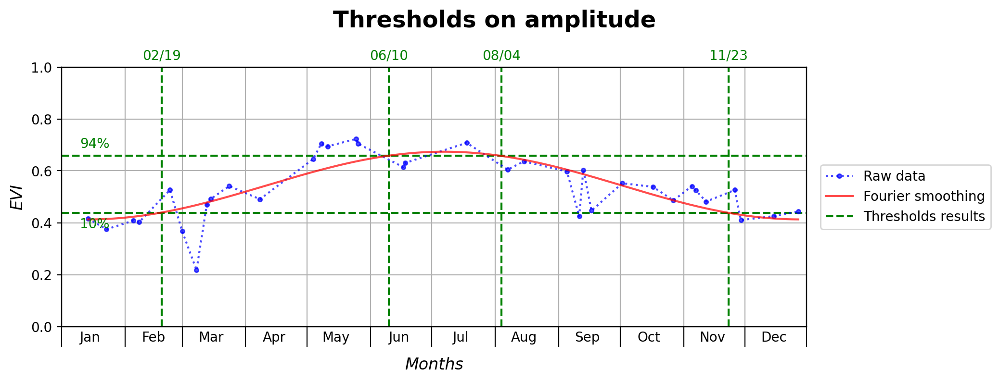

In [28]:
lookAmpli(allDoy, allEvi, allSmoothDoy, allSmoothEvi, 14)

### 6. Understand the utilisation of slopes

In [29]:
def whySlopes(monthsBound, midMonths, monthsAbb, allEvi, allDoy, allSmoothEvi, allSmoothDoy, index):
    
    breaksDoy, breaksDates, coefficients = slopeThresh(allSmoothDoy[index], allSmoothEvi[index])
    
    importantDays = []
    importantIndex = []
    thresh = []
    breaks = []

    importantIndex.append(coefficients.index(max(coefficients)))
    importantIndex.append(coefficients.index(min(coefficients)))

    importantDays.append(allSmoothDoy[index][importantIndex[0]])
    importantDays.append(allSmoothDoy[index][importantIndex[1]])

    importantIndex.insert(1, importantIndex[0] + np.array(np.abs(coefficients[importantIndex[0]:importantIndex[1]+1:])).argmin())
    importantDays.insert(1, allSmoothDoy[index][importantIndex[1]])

    thresh.append(0.63 * coefficients[importantIndex[0]])
    thresh.append(0.49 * coefficients[importantIndex[0]])
    thresh.append(0.49 * coefficients[importantIndex[2]])
    thresh.append(0.63 * coefficients[importantIndex[2]])

    # Graphics
    fig = plt.figure(figsize=(12,10), dpi=200)
    plt.subplot(211)
    plt.plot(allSmoothDoy[index], coefficients, label="Smooth curve")
    plt.vlines(importantDays, max(coefficients), min(coefficients), 'black', linewidth=1, label="Max / 0 / Min")
    plt.hlines(thresh, [10, importantDays[0]+10, importantDays[1]+10, importantDays[2]+10],
                       [importantDays[0]-10, importantDays[1]-10, importantDays[2]-10, 355], 'm', linewidth=1, label="Thresholds")
    plt.xlabel("Year's day", size='large', style='italic')
    plt.ylabel('Slope coefficient', size='large', style='italic')
    plt.xlim(0, 365)
    plt.grid()
    plt.legend()

    plt.subplot(212)
    plt.plot(allSmoothDoy[index], allSmoothEvi[index], label="Smooth curve")
    plt.vlines(importantDays, min(allSmoothEvi[index])-0.1, max(allSmoothEvi[index])+0.1, 'black', linewidth=1, label="Important days")
    plt.vlines(breaksDoy, min(allSmoothEvi[index])-0.1, max(allSmoothEvi[index])+0.1, 'm', linewidth=1, label="Breakdates")
    plt.xlabel("Year's day", size='large', style='italic')
    plt.ylabel('EVI', size='large', style='italic')
    plt.xlim(0, 365)
    plt.ylim(0, 1)
    plt.grid()
    plt.legend()

    fig.subplots_adjust(hspace=0.3)

    plt.show()

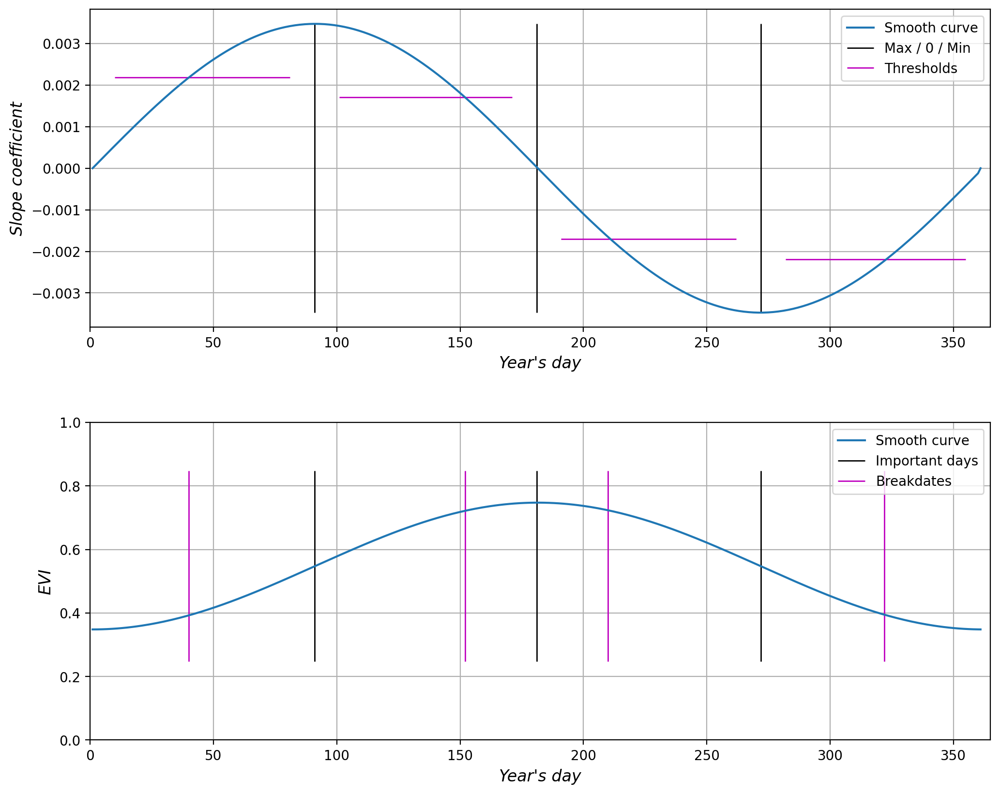

In [30]:
whySlopes(monthsBound, midMonths, monthsAbb, allEvi, allDoy, allSmoothEvi, allSmoothDoy, 1)

### 7. Look at slopes

In [31]:
def lookAmpli(allDoy, allEvi, allSmoothDoy, allSmoothEvi, index):
    
    slopeBreaksDoy, slopeBreaksDates = slopeThresh(allSmoothDoy[index], allSmoothEvi[index])[:2:]

    # Graphics
    fig = plt.figure(figsize=(12,4), dpi=200)
    plt.suptitle('Thresholds on slopes', size='xx-large', weight='bold', y=0.95)

    plt.plot(allDoy[index], allEvi[index], 'b:o', markersize=3, label='Raw data', alpha=0.7)
    plt.plot(allSmoothDoy[index], allSmoothEvi[index], 'r', markersize=3, label='Fourier smoothing', alpha=0.7)
    plt.vlines(slopeBreaksDoy, 0, 1, 'g', linestyle='--', label='Thresholds results')
    plt.ylim(0,1)
    plt.ylabel('EVI', size='large', style='italic')
    plt.xlim(1,365)
    plt.xlabel("Year's day", size='large', style='italic')
    plt.legend(loc='center left', bbox_to_anchor=(1.01,0.5))
    plt.grid()

    fig.subplots_adjust(top=0.8, right=0.77)

    axes = plt.gca()

    axes.xaxis.set_ticks(monthsBound)
    axes.xaxis.set_tick_params(length=15)
    axes.xaxis.set_ticklabels([''])

    axes.xaxis.set_ticks(midMonths, minor=True)
    axes.xaxis.set_tick_params(length=0, which='minor')
    axes.xaxis.set_ticklabels(monthsAbb, minor=True)

    plt.xlabel("Months", size='large', style='italic')

    axesNew = axes.twiny()
    axesNew.set_xlim(1,365)
    axesNew.xaxis.set_ticks(slopeBreaksDoy)
    axesNew.xaxis.set_tick_params(length=0, labelcolor='g', top=True)
    axesNew.xaxis.set_ticklabels(slopeBreaksDates)

    plt.show()

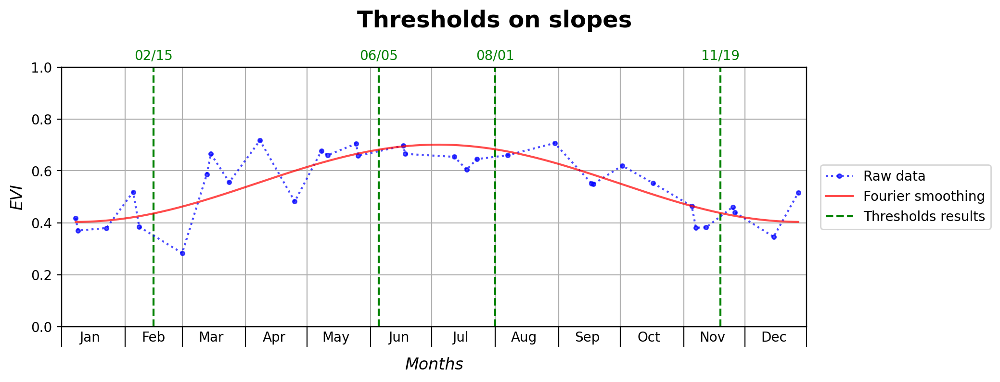

In [32]:
lookAmpli(allDoy, allEvi, allSmoothDoy, allSmoothEvi, 60)

## Do a resume in .txt

In [33]:
def changeList(l):
    stringList = []
    for i in range (len(l)):
        string = '['
        for j in range (len(l[0])):
            val = str(int(round(l[i][j])))
            if len(val) == 1:
                string += '  ' + val
            elif len(val) == 2:
                string += ' ' + val
            else:
                string += val
            if j != 3:
                string += ', '
            else:
                string += ']'
        stringList.append(string)
    return stringList

infos = np.array(list(addInfo.values()))
indexes = set(pandasBreaks.index_agristats.values)

diffValues = np.arange(np.min([np.min(infos[:,0]), np.min(infos[:,1])]), np.max([np.max(infos[:,0]), np.max(infos[:,1])]) + 1, 1)
diffValues = sorted(diffValues, reverse=True)

tempPiece = np.array([np.array(li) for li in pandasBreaks.breaksPiecewise.values if (len(li) == 4)])
tempAmpli = np.array([np.array(li) for li in pandasBreaks.breaksAmplitude.values if (len(li) == 4)])
tempSlope = np.array([np.array(li) for li in pandasBreaks.breaksSlope.values if (len(li) == 4)])

means, stds = [], []

means.append(np.mean(tempPiece, axis=0))
means.append(np.mean(tempAmpli, axis=0))
means.append(np.mean(tempSlope, axis=0))

stds.append(np.std(tempPiece, axis=0))
stds.append(np.std(tempAmpli, axis=0))
stds.append(np.std(tempSlope, axis=0))

means = changeList(means)
stds = changeList(stds)

temp = ''
for i in diffValues:
    temp += '-----+'

txt = "Statistics calculated on pixels with a gap of maximum X days over the year.\n"
txt += "Number of corresponding pixels: {}.\n\n".format(len(geoMODIS))

txt += "Identification fails on {} pixels. So it remains {} time-series.\n\n".format(len(geoMODIS)-len(infos), len(infos))

txt += "+----------------------------+" + temp + '\n'
txt += "| Nb of measurements         |"

for val in diffValues:
    val = str(val)
    if len(val) == 2:
        val = ' ' + val

    txt += ' {} |'.format(val)

txt += "\n+----------------------------+" + temp
txt += "\n| Nb of corresponding pixels |"

for val in diffValues:
    val = str(list(infos[:,0]).count(val))
    if len(val) == 1:
        val = '  ' + val
    elif len(val) == 2:
        val = ' ' + val

    txt += ' {} |'.format(val)

txt += "\n+----------------------------+" + temp

txt += "\n\n+----------------------------+" + temp + '\n'
txt += "| Nb of days w/ measurements |"

for val in diffValues:
    val = str(val)
    if len(val) == 2:
        val = ' ' + val

    txt += ' {} |'.format(val)

txt += "\n+----------------------------+" + temp
txt += "\n| Nb of corresponding pixels |"

for val in diffValues:
    val = str(list(infos[:,1]).count(val))
    if len(val) == 1:
        val = '  ' + val
    elif len(val) == 2:
        val = ' ' + val

    txt += ' {} |'.format(val)

txt += "\n+----------------------------+" + temp

txt += "\n\n"


txt += "                    +--------------------------------------------------------------------+\n"
txt += "                    |     On the entire quadrat                                          |\n"
txt += "                    +----------------------+----------------------+----------------------+\n"
txt += "                    | Piecewise            | Amplitude            | Slope coefficient    |\n"
txt += "+-------------------+----------------------+----------------------+----------------------+\n"
txt += "|             Means | {} | {} | {} |\n".format(means[0], means[1], means[2])
txt += "|Standard deviation | {} | {} | {} |\n".format(stds[0], stds[1], stds[2])
txt += "+-------------------+----------------------+----------------------+----------------------+"

for ind in indexes:
    txt += "\n\n"

    agriName = pandasFilteredAgristats.iloc[ind].EDNAME
    agriName = ' ' * (26-len(agriName)) + agriName

    agriValue = str(round(pandasFilteredAgristats.iloc[ind].HNVf_likel, 2))
    if len(agriValue) == 3:
        agriValue = agriValue + '0'

    tempPandas = pandasBreaks[(pandasBreaks['index_agristats'] == ind)]
    tempPiece = np.array([np.array(li) for li in tempPandas.breaksPiecewise.values if (len(li) == 4)])
    tempAmpli = np.array([np.array(li) for li in tempPandas.breaksAmplitude.values if (len(li) == 4)])
    tempSlope = np.array([np.array(li) for li in tempPandas.breaksSlope.values if (len(li) == 4)])

    successPix = str(len(tempPiece))
    if len(successPix) == 1:
        successPix = '000' + successPix
    elif len(successPix) == 2:
        successPix = '00' + successPix
    elif len(successPix) == 3:
        successPix = '0' + successPix

    agriPix = str(len(pandasBreaks[pandasBreaks['index_agristats'] == ind]))
    if len(agriPix) == 1:
        agriPix = '000' + agriPix
    elif len(agriPix) == 2:
        agriPix = '00' + agriPix
    elif len(agriPix) == 3:
        agriPix = '0' + agriPix

    nbPix = successPix + '/' + agriPix


    if len(tempPiece) == 0:
        txt += "                    +--------------------------------------------------------------------+\n"
        txt += "                    | {}, HNV value {}, work on 0000/{} pxs  |\n".format(agriName, agriValue, agriPix)
        txt += "                    +----------------------+----------------------+----------------------+\n"
        txt += "                    | Piecewise            | Amplitude            | Slope coefficient    |\n"
        txt += "+-------------------+----------------------+----------------------+----------------------+\n"
        txt += "|             Means | [---, ---, ---, ---] | [---, ---, ---, ---] | [---, ---, ---, ---] |\n"
        txt += "|Standard deviation | [---, ---, ---, ---] | [---, ---, ---, ---] | [---, ---, ---, ---] |\n"
        txt += "+-------------------+----------------------+----------------------+----------------------+"

        continue

    means, stds = [], []

    means.append(np.mean(tempPiece, axis=0))
    means.append(np.mean(tempAmpli, axis=0))
    means.append(np.mean(tempSlope, axis=0))

    stds.append(np.std(tempPiece, axis=0))
    stds.append(np.std(tempAmpli, axis=0))
    stds.append(np.std(tempSlope, axis=0))

    means = changeList(means)
    stds = changeList(stds)

    txt += "                    +--------------------------------------------------------------------+\n"
    txt += "                    | {}, HNV value {}, work on {} pxs  |\n".format(agriName, agriValue, nbPix)
    txt += "                    +----------------------+----------------------+----------------------+\n"
    txt += "                    | Piecewise            | Amplitude            | Slope coefficient    |\n"
    txt += "+-------------------+----------------------+----------------------+----------------------+\n"
    txt += "|             Means | {} | {} | {} |\n".format(means[0], means[1], means[2])
    txt += "|Standard deviation | {} | {} | {} |\n".format(stds[0], stds[1], stds[2])
    txt += "+-------------------+----------------------+----------------------+----------------------+"
    
print (txt)

Statistics calculated on pixels with a gap of maximum X days over the year.
Number of corresponding pixels: 462.

Identification fails on 113 pixels. So it remains 349 time-series.

+----------------------------+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
| Nb of measurements         |  43 |  42 |  41 |  40 |  39 |  38 |  37 |  36 |  35 |  34 |  33 |  32 |  31 |  30 |  29 |  28 |  27 |  26 |  25 |  24 |  23 |  22 |  21 |  20 |  19 |  18 |  17 |
+----------------------------+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+-----+
| Nb of corresponding pixels |   7 |   9 |  33 |  31 |  58 |  58 |  54 |  41 |  30 |  19 |   4 |   2 |   2 |   0 |   0 |   0 |   0 |   0 |   0 |   0 |   0 |   0 |   0 |   0 |   1 |   0 |   0 |
+----------------------------+-----+-----+----